# Loading some packages

In [1]:
# !pip install pandas
# !pip install matplotlib
# !pip install numpy
# !pip install seaborn
# !pip install tensorflow
# !pip install scikit-learn 
# !pip install tensorflow

In [2]:
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib import rc
from pylab import rcParams
plt.style.use('fivethirtyeight')
# from tensorflow.keras.models import Model
# from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
# from statsmodels.tsa.seasonal import seasonal_decompose

In [3]:
%matplotlib inline
%config InlineBackend. figure_format='retina'
sns.set(style='darkgrid', palette='muted', font_scale=1.2, rc={"axes.facecolor": "#2E2E2E", "axes.grid": True, "grid.color": "#333333", "axes.edgecolor": "#424242"})
color_pal = ['#FF6E40', '#FFEA00', '#1DE9B6', '#00E5FF', '#D500F9']
sns.set_palette(sns.color_palette(color_pal))
rcParams['figure.figsize' ] = 14, 7
rcParams['text.color'] = 'black'       # Titles and text
rcParams['axes.labelcolor'] = 'white'  # Axis labels
rcParams['xtick.color'] = 'black'      # X-axis tick labels
rcParams['ytick.color'] = 'black'
tqdm. pandas ()

# Reading the dataset. Working with a small version of the dataset for proof of concept.

In [4]:
dfMachineMeta  = pd.read_csv("./originalData/machine_meta.csv")
# dfMachineUsage = pd.read_csv("./machine_usage.csv")

In [5]:
dfMachineUsage = pd.read_csv("./originalData/machine_usage.csv") 

In [7]:
# null_counts = dfMachineUsage.isnull().sum()
# print(null_counts)

In [6]:
dfMachineMeta.columns

Index(['m_1', '0', '219', '17', '96', '100', 'USING'], dtype='object')

In [7]:
dfMachineUsage.columns

Index(['m_1932', '386640', '41', '92', 'Unnamed: 4', 'Unnamed: 5', '43.04',
       '33.08', '5'],
      dtype='object')

In [8]:
dfMachineUsage.memory_usage(deep=True).sum()

31292851874

In [9]:
dfMachineUsage.shape

(246934819, 9)

In [10]:
dfMachineMeta.columns = ['machine_id','timestamp','failure_domain_1','failure_domain_2','cpu_num','mem_size','status']
dfMachineUsage.columns = ['machine_id','timestamp','cpu_util_percent','mem_util_percent','mem_gps','mkpi','net_in','net_out','disk_io_percent']

In [11]:
dfMachineUsage.nunique()

machine_id           4023
timestamp           67242
cpu_util_percent      101
mem_util_percent       99
mem_gps              5649
mkpi                   18
net_in              10001
net_out             10001
disk_io_percent       103
dtype: int64

In [12]:
dfMachineUsage

,machine_id,timestamp,cpu_util_percent,mem_util_percent,mem_gps,mkpi,net_in,net_out,disk_io_percent
0,m_1932,386670,43.0,92,NaN,NaN,43.04,33.08,5
1,m_1932,386690,44.0,92,NaN,NaN,43.05,33.08,5
2,m_1932,386800,46.0,92,NaN,NaN,43.05,33.08,3
3,m_1932,386930,44.0,93,NaN,NaN,43.05,33.09,4
4,m_1932,387000,41.0,93,NaN,NaN,43.05,33.09,4
...,...,...,...,...,...,...,...,...,...
246934814,m_1932,655420,45.0,93,1.88,0.0,48.73,37.73,4
246934815,m_1932,655580,54.0,96,0.49,1.0,48.74,37.73,7
246934816,m_1932,655720,39.0,94,1.97,1.0,48.74,37.73,10
246934817,m_1932,655890,36.0,93,2.89,1.0,48.74,37.74,6


In [13]:
dfMachineUsage.head(20)

,machine_id,timestamp,cpu_util_percent,mem_util_percent,mem_gps,mkpi,net_in,net_out,disk_io_percent
0,m_1932,386670,43.0,92,NaN,NaN,43.04,33.08,5
1,m_1932,386690,44.0,92,NaN,NaN,43.05,33.08,5
2,m_1932,386800,46.0,92,NaN,NaN,43.05,33.08,3
3,m_1932,386930,44.0,93,NaN,NaN,43.05,33.09,4
4,m_1932,387000,41.0,93,NaN,NaN,43.05,33.09,4
5,m_1932,387090,46.0,93,NaN,NaN,43.05,33.09,3
6,m_1932,387170,47.0,93,NaN,NaN,43.05,33.09,4
7,m_1932,387180,46.0,93,NaN,NaN,43.05,33.09,3
8,m_1932,387200,46.0,93,NaN,NaN,43.05,33.09,3
9,m_1932,387530,46.0,93,NaN,NaN,43.06,33.10,5


# Doing one hot encoding for the machine ids

In [15]:
dfMachineUsage['machine_id'] = dfMachineUsage['machine_id'].astype('category').cat.codes

# Obtain a new time series data for each machine_id

In [16]:
machinePool = dfMachineUsage['machine_id'].unique()
len(machinePool)

4023

In [29]:
machineDict = {machine: group.sort_values("timestamp").reset_index(drop=True) for machine, group in dfMachineUsage.groupby("machine_id")}


# Checking for the uneven-ness of timestamps. Working with m_1932 from now on.

In [30]:
# Calculate the time differences between consecutive timestamps, drop NaNs, and sort them
timestamp_diff = machineDict[0]['timestamp'].diff().dropna().sort_values().unique()

# Print the sorted unique time differences
print(timestamp_diff)


[1.000e+01 2.000e+01 3.000e+01 4.000e+01 5.000e+01 6.000e+01 7.000e+01
 8.000e+01 9.000e+01 1.300e+02 1.400e+02 1.700e+02 1.900e+02 2.500e+02
 3.100e+02 3.300e+02 4.300e+02 5.000e+02 5.300e+02 5.600e+02 6.500e+02
 1.290e+03 1.500e+03 1.580e+03 1.590e+03 1.820e+03 3.230e+03 4.450e+03
 4.770e+03 5.280e+03 8.620e+03 8.920e+03 1.968e+04]


Bin Range: 10.00 - 13.93, Count: 61483.0, Percentage: 99.45%
Bin Range: 17.87 - 21.80, Count: 244.0, Percentage: 0.39%
Bin Range: 29.67 - 33.60, Count: 21.0, Percentage: 0.03%
Bin Range: 37.54 - 41.47, Count: 10.0, Percentage: 0.02%
Bin Range: 49.34 - 53.27, Count: 3.0, Percentage: 0.00%
Bin Range: 57.21 - 61.14, Count: 1.0, Percentage: 0.00%
Bin Range: 69.01 - 72.94, Count: 27.0, Percentage: 0.04%
Bin Range: 76.88 - 80.81, Count: 2.0, Percentage: 0.00%
Bin Range: 88.68 - 92.61, Count: 1.0, Percentage: 0.00%
Bin Range: 128.02 - 131.95, Count: 2.0, Percentage: 0.00%
Bin Range: 139.82 - 143.76, Count: 1.0, Percentage: 0.00%
Bin Range: 167.36 - 171.29, Count: 6.0, Percentage: 0.01%
Bin Range: 187.03 - 190.96, Count: 2.0, Percentage: 0.00%
Bin Range: 249.97 - 253.91, Count: 1.0, Percentage: 0.00%
Bin Range: 308.98 - 312.92, Count: 1.0, Percentage: 0.00%
Bin Range: 328.65 - 332.59, Count: 1.0, Percentage: 0.00%
Bin Range: 427.00 - 430.94, Count: 1.0, Percentage: 0.00%
Bin Range: 497.82 - 50

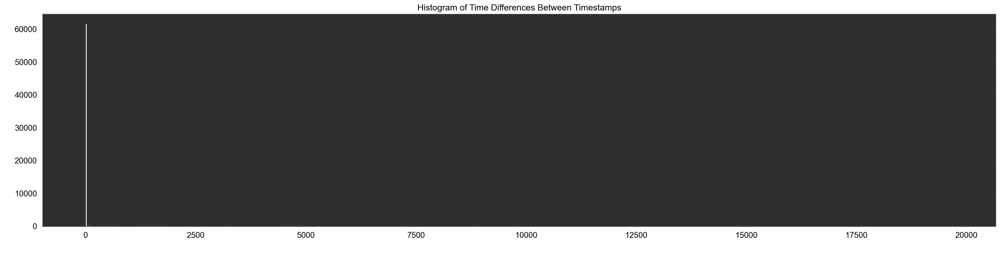

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the time differences between consecutive timestamps
timestamp_diff = machineDict[0]['timestamp'].diff()

# Set figure size to increase width
plt.figure(figsize=(25, 6))  # Adjust the width (25) and height (6)

# Plot histogram of the time differences and capture the bin edges and counts
counts, bin_edges, _ = plt.hist(timestamp_diff.dropna(), bins=5000)

# Add titles and labels
plt.title("Histogram of Time Differences Between Timestamps")
plt.xlabel("Time Difference (seconds)")
plt.ylabel("Frequency")

# Display the range and percentage for each bin
total_count = sum(counts)
for i in range(len(counts)):
    if counts[i] > 0:  # Only show for bins with non-zero counts
        # Calculate the percentage for the current bin
        percentage = (counts[i] / total_count) * 100
        
        # Bin range (from bin_edges[i] to bin_edges[i+1])
        bin_range = f"{bin_edges[i]:.2f} - {bin_edges[i+1]:.2f}"
        
        # Print range and percentage
        print(f"Bin Range: {bin_range}, Count: {counts[i]}, Percentage: {percentage:.2f}%")

# Show the plot
plt.show()


In [37]:
# Calculate the standard deviation of time differences
std_diff = timestamp_diff.std()
mean_diff = timestamp_diff.mean()

print(f"Standard Deviation: {std_diff}")
print(f"Mean Time Difference: {mean_diff}")


# Calculate the coefficient of variation (CV)
cv = std_diff / mean_diff
print(f"Coefficient of Variation: {cv}")


Standard Deviation: 101.35019229801873
Mean Time Difference: 11.179981560260744
Coefficient of Variation: 9.06532732202959


Coefficient of variation of greater than 0.1 means they are not suitable for treating as equal intervals of time.


<Axes: >

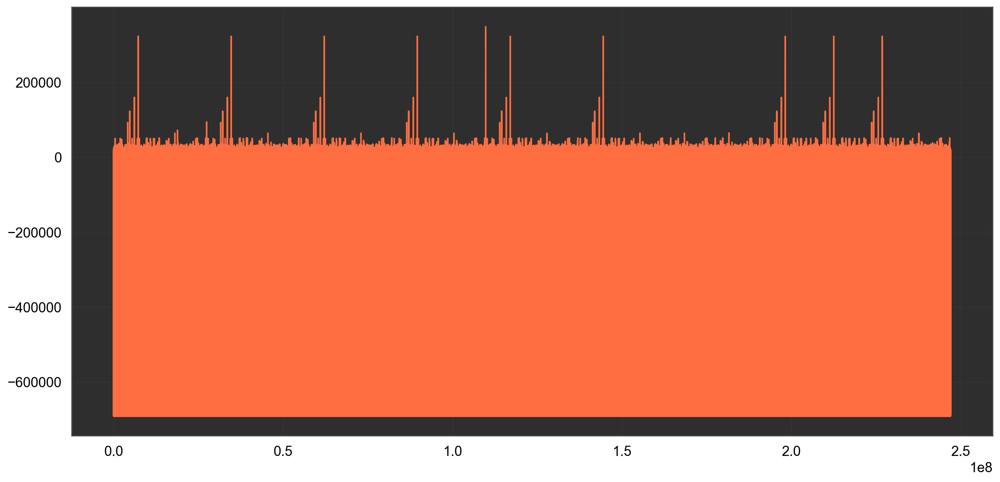

In [38]:
dfMachineUsage['timestamp'].diff().plot()

# Fixing the missing values for mkpi and mem_gps

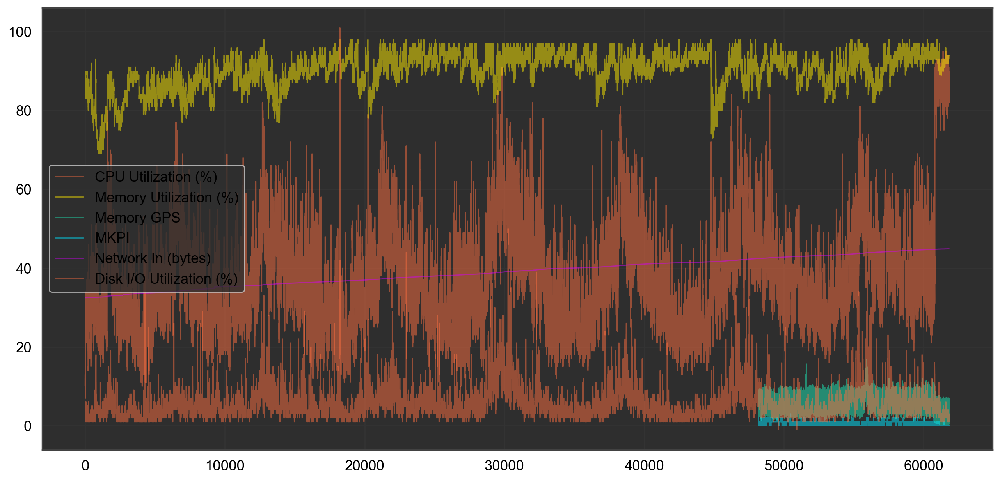

In [39]:

plt.plot(machineDict[0]['cpu_util_percent'], lw=1, label='CPU Utilization (%)', alpha=0.5)
plt.plot(machineDict[0]['mem_util_percent'], lw=1, label='Memory Utilization (%)',alpha=0.5)
plt.plot(machineDict[0]['mem_gps'], lw=1, label='Memory GPS',alpha=0.5)
plt.plot(machineDict[0]['mkpi'], lw=1, label='MKPI',alpha=0.5)
plt.plot(machineDict[0]['net_in'], lw=1, label='Network In (bytes)',alpha=0.5)
plt.plot(machineDict[0]['disk_io_percent'], lw=1, label='Disk I/O Utilization (%)',alpha=0.5)

plt.legend()

plt.show()

In [40]:
null_counts = machineDict[0].isnull().sum()
print(null_counts)

machine_id              0
timestamp               0
cpu_util_percent        0
mem_util_percent        0
mem_gps             48833
mkpi                48833
net_in                  0
net_out                 0
disk_io_percent         0
dtype: int64


<Axes: >

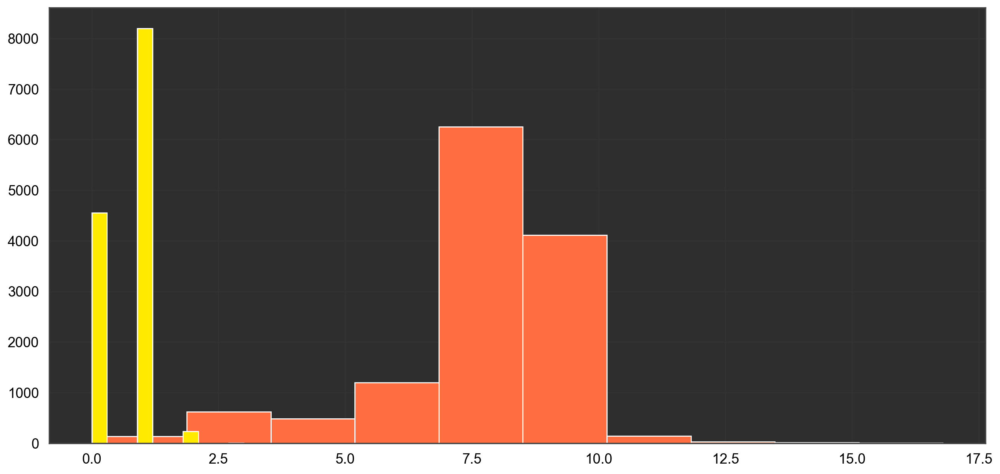

In [41]:
machineDict[0]['mem_gps'].hist()
machineDict[0]['mkpi'].hist()

<Axes: >

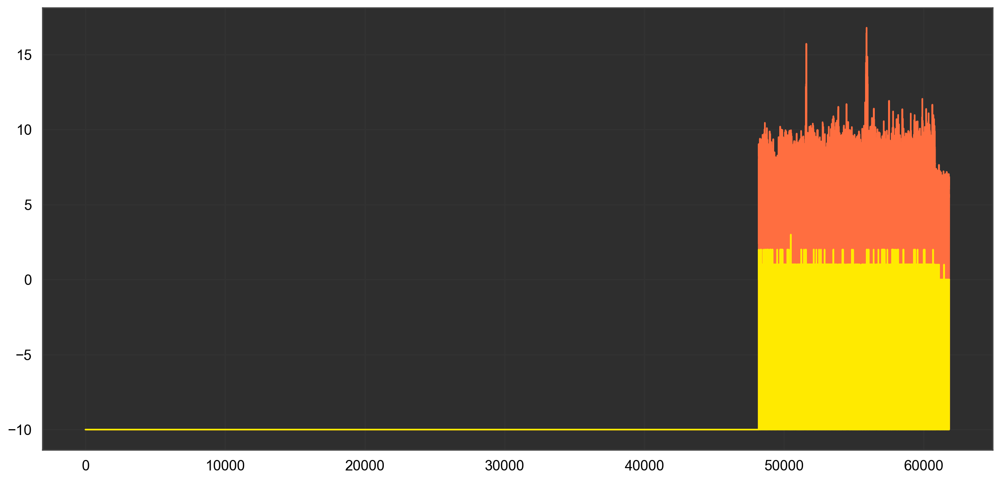

In [42]:
# Copy specific columns into new Series
mem_gps_filled = machineDict[0]['mem_gps'].copy()
mkpi_filled = machineDict[0]['mkpi'].copy()

# Impute missing values with -1
mem_gps_filled.fillna(-10, inplace=True)
mkpi_filled.fillna(-10, inplace=True)

mem_gps_filled.plot()
mkpi_filled.plot()

In [43]:
machineDict[0]['mem_gps'] = machineDict[0]['mem_gps'].fillna(method='bfill')
machineDict[0]['mkpi'] = machineDict[0]['mkpi'].fillna(method='bfill')


/tmp/ipykernel_2345127/2902837172.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machineDict[0]['mem_gps'] = machineDict[0]['mem_gps'].fillna(method='bfill')
/tmp/ipykernel_2345127/2902837172.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machineDict[0]['mkpi'] = machineDict[0]['mkpi'].fillna(method='bfill')


In [44]:
null_counts = machineDict[0].isnull().sum()
print(null_counts)

machine_id          0
timestamp           0
cpu_util_percent    0
mem_util_percent    0
mem_gps             0
mkpi                0
net_in              0
net_out             0
disk_io_percent     0
dtype: int64


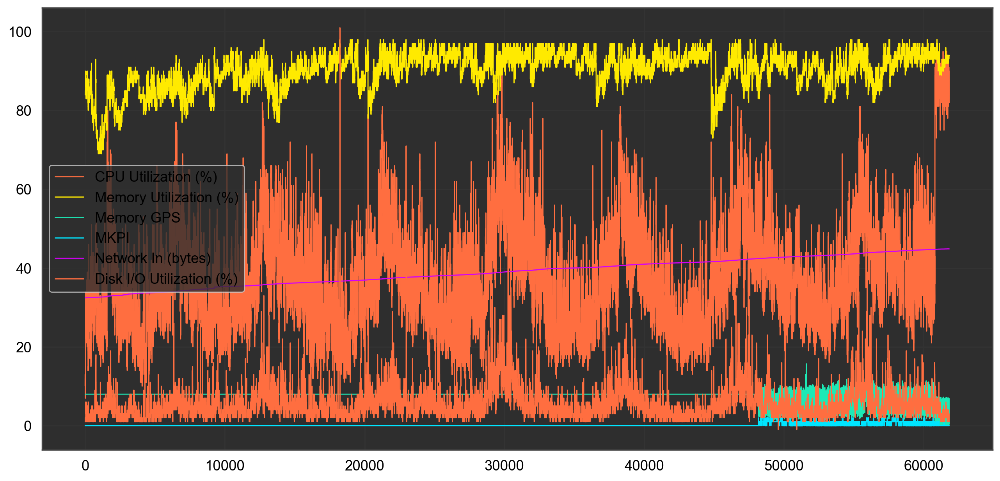

In [45]:
plt.plot(machineDict[0]['cpu_util_percent'], lw=1, label='CPU Utilization (%)')
plt.plot(machineDict[0]['mem_util_percent'], lw=1, label='Memory Utilization (%)')
plt.plot(machineDict[0]['mem_gps'], lw=1, label='Memory GPS')
plt.plot(machineDict[0]['mkpi'], lw=1, label='MKPI')
plt.plot(machineDict[0]['net_in'], lw=1, label='Network In (bytes)')
plt.plot(machineDict[0]['disk_io_percent'], lw=1, label='Disk I/O Utilization (%)')

plt.legend()

plt.show()

# Fixing the unevenness of timestamp with resampling and going down to mean-ish time difference

In [46]:
machine_id = 0
machineDict[0]['timestamp'] = pd.to_datetime(machineDict[0]['timestamp'], unit='s')
machineDict[machine_id]

,machine_id,timestamp,cpu_util_percent,mem_util_percent,mem_gps,mkpi,net_in,net_out,disk_io_percent
0,0,1970-01-01 00:00:10,13.0,84,7.99,0.0,32.46,23.09,1
1,0,1970-01-01 00:00:20,10.0,84,7.99,0.0,32.46,23.09,1
2,0,1970-01-01 00:00:30,11.0,84,7.99,0.0,32.46,23.09,1
3,0,1970-01-01 00:00:40,12.0,84,7.99,0.0,32.46,23.09,1
4,0,1970-01-01 00:00:50,12.0,84,7.99,0.0,32.46,23.09,1
...,...,...,...,...,...,...,...,...,...
61819,0,1970-01-08 23:59:10,87.0,94,6.59,0.0,44.86,31.56,2
61820,0,1970-01-08 23:59:20,86.0,94,6.60,0.0,44.86,31.56,2
61821,0,1970-01-08 23:59:30,88.0,94,6.62,0.0,44.86,31.56,2
61822,0,1970-01-08 23:59:40,83.0,94,6.66,0.0,44.86,31.56,2


In [47]:
resampling_frequency = '15S'

machine_id = 0
machine_data = machineDict[machine_id]

machine_data['timestamp'] = pd.to_datetime(machine_data['timestamp'])
machine_data = machine_data.set_index('timestamp')

resampled_data = machine_data.resample(resampling_frequency).mean()
resampled_data = resampled_data.interpolate(method='linear')

machineDict[machine_id] = resampled_data


/tmp/ipykernel_2345127/598569978.py:9: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  resampled_data = machine_data.resample(resampling_frequency).mean()


In [48]:
machineDict[0]

,machine_id,cpu_util_percent,mem_util_percent,mem_gps,mkpi,net_in,net_out,disk_io_percent
timestamp,,,,,,,,
1970-01-01 00:00:00,0.0,13.0,84.0,7.990,0.0,32.46,23.09,1.0
1970-01-01 00:00:15,0.0,10.0,84.0,7.990,0.0,32.46,23.09,1.0
1970-01-01 00:00:30,0.0,11.5,84.0,7.990,0.0,32.46,23.09,1.0
1970-01-01 00:00:45,0.0,12.0,84.0,7.990,0.0,32.46,23.09,1.0
1970-01-01 00:01:00,0.0,11.0,84.0,7.990,0.0,32.46,23.09,2.0
...,...,...,...,...,...,...,...,...
1970-01-08 23:58:45,0.0,88.0,94.0,6.310,0.0,44.86,31.56,3.0
1970-01-08 23:59:00,0.0,86.0,94.0,6.645,0.0,44.86,31.56,2.0
1970-01-08 23:59:15,0.0,86.0,94.0,6.600,0.0,44.86,31.56,2.0


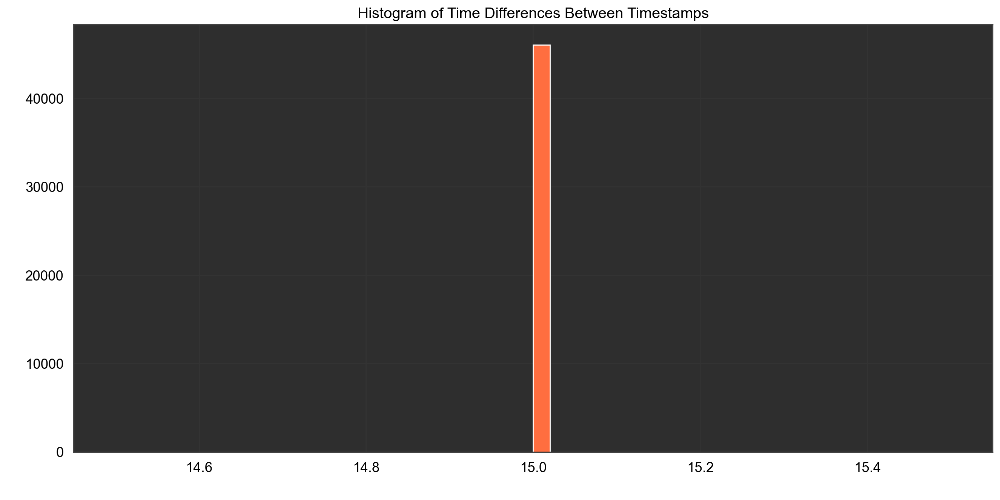

In [49]:
timestamp_diff = machineDict[0].index.to_series().diff()
# Plot histogram of the time differences
plt.hist(timestamp_diff.dropna().dt.total_seconds(), bins=50)
plt.title("Histogram of Time Differences Between Timestamps")
plt.xlabel("Time Difference (seconds)")
plt.ylabel("Frequency")
plt.show()



# Creating the prediction column of CPU difference


In [50]:
machineDict[0]['cpu_difference'] = machineDict[0]['cpu_util_percent'].diff()
machineDict[0]

,machine_id,cpu_util_percent,mem_util_percent,mem_gps,mkpi,net_in,net_out,disk_io_percent,cpu_difference
timestamp,,,,,,,,,
1970-01-01 00:00:00,0.0,13.0,84.0,7.990,0.0,32.46,23.09,1.0,NaN
1970-01-01 00:00:15,0.0,10.0,84.0,7.990,0.0,32.46,23.09,1.0,-3.0
1970-01-01 00:00:30,0.0,11.5,84.0,7.990,0.0,32.46,23.09,1.0,1.5
1970-01-01 00:00:45,0.0,12.0,84.0,7.990,0.0,32.46,23.09,1.0,0.5
1970-01-01 00:01:00,0.0,11.0,84.0,7.990,0.0,32.46,23.09,2.0,-1.0
...,...,...,...,...,...,...,...,...,...
1970-01-08 23:58:45,0.0,88.0,94.0,6.310,0.0,44.86,31.56,3.0,3.0
1970-01-08 23:59:00,0.0,86.0,94.0,6.645,0.0,44.86,31.56,2.0,-2.0
1970-01-08 23:59:15,0.0,86.0,94.0,6.600,0.0,44.86,31.56,2.0,0.0


# Rescaling to 0 to 1 for all data


In [51]:
scaler = MinMaxScaler()

numerical_cols = machineDict[0].select_dtypes(include=['number']).columns
machineDict[0][numerical_cols] = scaler.fit_transform(machineDict[0][numerical_cols])

print(machineDict[0].head())


                     machine_id  cpu_util_percent  mem_util_percent   mem_gps  \
timestamp                                                                       
1970-01-01 00:00:00         0.0          0.068966          0.517241  0.485322   
1970-01-01 00:00:15         0.0          0.034483          0.517241  0.485322   
1970-01-01 00:00:30         0.0          0.051724          0.517241  0.485322   
1970-01-01 00:00:45         0.0          0.057471          0.517241  0.485322   
1970-01-01 00:01:00         0.0          0.045977          0.517241  0.485322   

                     mkpi  net_in  net_out  disk_io_percent  cpu_difference  
timestamp                                                                    
1970-01-01 00:00:00   0.0     0.0      0.0         0.019608             NaN  
1970-01-01 00:00:15   0.0     0.0      0.0         0.019608        0.459627  
1970-01-01 00:00:30   0.0     0.0      0.0         0.019608        0.515528  
1970-01-01 00:00:45   0.0     0.0      0.0

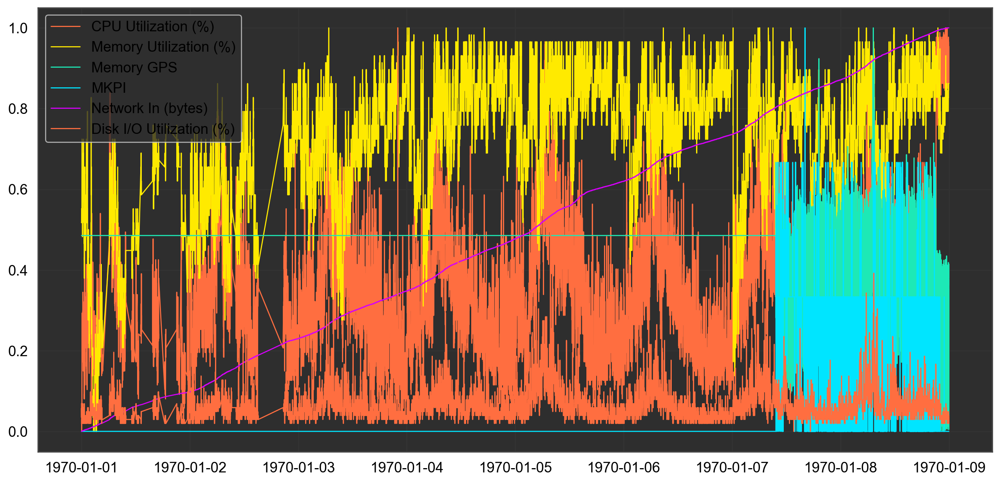

In [52]:
plt.plot(machineDict[0]['cpu_util_percent'], lw=1, label='CPU Utilization (%)')
plt.plot(machineDict[0]['mem_util_percent'], lw=1, label='Memory Utilization (%)')
plt.plot(machineDict[0]['mem_gps'], lw=1, label='Memory GPS')
plt.plot(machineDict[0]['mkpi'], lw=1, label='MKPI')
plt.plot(machineDict[0]['net_in'], lw=1, label='Network In (bytes)')
plt.plot(machineDict[0]['disk_io_percent'], lw=1, label='Disk I/O Utilization (%)')

plt.legend()

plt.show()

# Checking for correlation matrix 

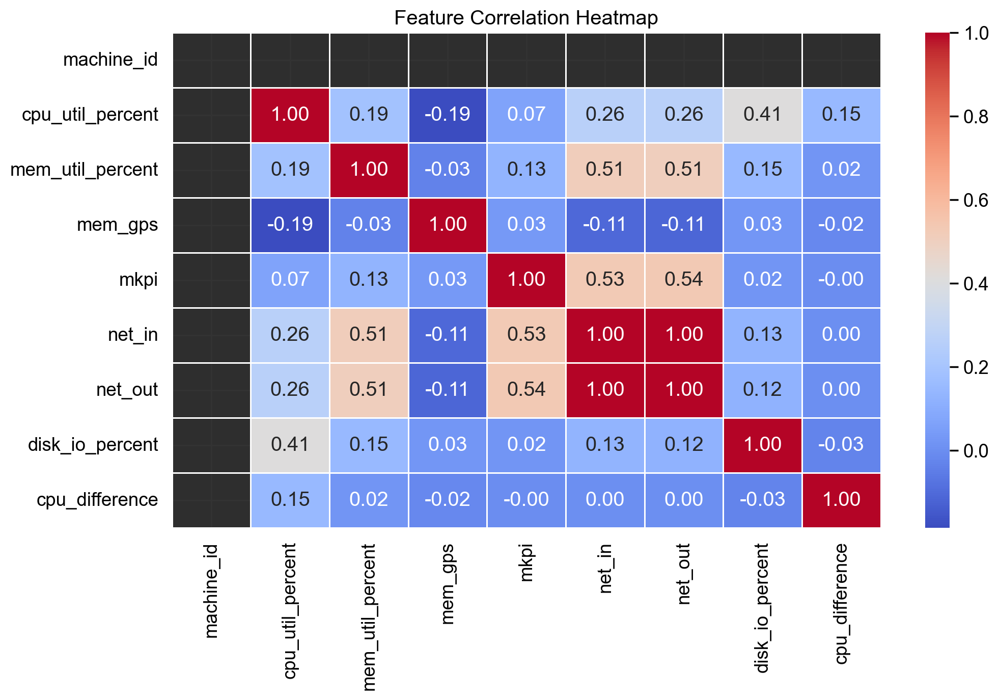

In [53]:
# Compute correlation matrix
correlation_matrix = machineDict[0].corr()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()


In [174]:
# machineDict[0]

# Doing this for all the machines and storing to file 

In [56]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
# machineDict[0]['mem_gps'] = machineDict[0]['mem_gps'].fillna(method='bfill')
# machineDict[0]['mkpi'] = machineDict[0]['mkpi'].fillna(method='bfill')

def process_machine_data(machineDict):
    for machine_id, machine_data in machineDict.items():
        print(f"Processing machine number {machine_id}")
        # Impute missing values for 'mem_gps' and 'mkpi'
        machine_data['mem_gps'].fillna(method='bfill', inplace=True)
        machine_data['mkpi'].fillna(method='bfill', inplace=True)

        # Reset index to access the 'timestamp' column for conversion
        machine_data.reset_index(inplace=True)

        # Convert the 'timestamp' column to datetime
        machine_data['timestamp'] = pd.to_datetime(machine_data['timestamp'], unit='s')

        # Set 'timestamp' as the index again
        machine_data.set_index('timestamp', inplace=True)

        # Resample to minute frequency and interpolate missing data
        resampled_data = machine_data.resample('15S').mean()
        resampled_data = resampled_data.interpolate(method='linear')

        # Create a CPU utilization difference column
        resampled_data['cpu_difference'] = resampled_data['cpu_util_percent'].diff()

        # Rescale all numerical columns to a 0-1 range
        numerical_cols = resampled_data.select_dtypes(include=['number']).columns
        scaler = MinMaxScaler()
        resampled_data[numerical_cols] = scaler.fit_transform(resampled_data[numerical_cols])

        # Save the processed data to a CSV file
        resampled_data.to_csv(f'./processedData/machine_{machine_id}_processed.csv')

# Run the function for all machines
process_machine_data(machineDict)


Processing machine number 0


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 5


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 6


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 7


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 8


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 9


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 10


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 11


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 12


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 13


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 14


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 15


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 16


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 17


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 18


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 19


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 20


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 21


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 22


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 23


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 24


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 25


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 26


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 27


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 28


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 29


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 30


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 31


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 32


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 33


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 34


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 35


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 36


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 37


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 38


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 39


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 40


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 41


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 42


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 43


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 44


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 45


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 46


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 47


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 48


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 49


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 50


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 51


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 52


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 53


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 54


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 55


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 56


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 57


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 58


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 59


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 60


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 61


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 62


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 63


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 64


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 65


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 66


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 67


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 68


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 69


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 70


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 71


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 72


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 73


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 74


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 75


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 76


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 77


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 78


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 79


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 80


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 81


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 82


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 83


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 84


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 85


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 86


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 87


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 88


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 89


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 90


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 91


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 92


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 93


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 94


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 95


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 96


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 97


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 98


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 99


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 100


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 101


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 102


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 103


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 104


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 105


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 106


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 107


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 108


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 109


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 110


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 111


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 112


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 113


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 114


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 115


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 116


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 117


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 118


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 119


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 120


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 121


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 122


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 123


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 124


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 125


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 126


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 127


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 128


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 129


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 130


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 131


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 132


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 133


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 134


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 135


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 136


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 137


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 138


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 139


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 140


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 141


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 142


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 143


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 144


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 145


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 146


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 147


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 148


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 149


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 150


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 151


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 152


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 153


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 154


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 155


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 156


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 157


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 158


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 159


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 160


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 161


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 162


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 163


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 164


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 165


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 166


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 167


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 168


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 169


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 170


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 171


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 172


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 173


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 174


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 175


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 176


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 177


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 178


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 179


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 180


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 181


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 182


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 183


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 184


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 185


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 186


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 187


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 188


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 189


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 190


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 191


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 192


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 193


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 194


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 195


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 196


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 197


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 198


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 199


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 200


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 201


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 202


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 203


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 204


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 205


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 206


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 207


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 208


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 209


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 210


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 211


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 212


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 213


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 214


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 215


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 216


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 217


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 218


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 219


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 220


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 221


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 222


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 223


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 224


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 225


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 226


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 227


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 228


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 229


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 230


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 231


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 232


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 233


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 234


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 235


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 236


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 237


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 238


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 239


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 240


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 241


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 242


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 243


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 244


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 245


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 246


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 247


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 248


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 249


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 250


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 251


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 252


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 253


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 254


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 255


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 256


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 257


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 258


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 259


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 260


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 261


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 262


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 263


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 264


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 265


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 266


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 267


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 268


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 269


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 270


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 271


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 272


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 273


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 274


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 275


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 276


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 277


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 278


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 279


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 280


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 281


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 282


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 283


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 284


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 285


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 286


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 287


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 288


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 289


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 290


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 291


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 292


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 293


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 294


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 295


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 296


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 297


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 298


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 299


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 300


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 301


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 302


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 303


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 304


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 305


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 306


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 307


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 308


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 309


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 310
Processing machine number 311


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 312


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 313


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 314


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 315


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 316


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 317


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 318


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 319


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 320


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 321


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 322


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 323


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 324


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 325


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 326


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 327


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 328


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 329


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 330


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 331


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 332


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 333


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 334


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 335


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 336


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 337


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 338


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 339


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 340


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 341


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 342


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 343


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 344


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 345


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 346


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 347


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 348


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 349


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 350


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 351


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 352


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 353


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 354


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 355


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 356


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 357


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 358


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 359


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 360


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 361


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 362


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 363


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 364


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 365


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 366


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 367


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 368


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 369


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 370


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 371


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 372


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 373


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 374


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 375


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 376


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 377


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 378


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 379


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 380


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 381


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 382


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 383


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 384


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 385


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 386


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 387


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 388


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 389
Processing machine number 390


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 391


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 392


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 393


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 394


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 395


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 396


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 397


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 398


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 399


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 400


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 401


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 402


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 403


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 404


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 405


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 406


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 407


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 408


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 409


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 410


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 411


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 412


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 413


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 414


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 415


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 416


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 417


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 418


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 419


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 420


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 421


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 422


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 423


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 424


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 425


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 426


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 427


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 428


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 429


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 430


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 431


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 432


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 433


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 434


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 435
Processing machine number 436


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 437


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 438


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 439


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 440


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 441


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 442


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 443


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 444


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 445


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 446


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 447


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 448


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 449


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 450


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 451


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 452


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 453


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 454


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 455


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 456


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 457


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 458


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 459


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 460


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 461


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 462


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 463


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 464


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 465


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 466


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 467


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 468


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 469


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 470


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 471


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 472


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 473


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 474


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 475


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 476


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 477


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 478


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 479


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 480


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 481


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 482


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 483


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 484


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 485


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 486


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 487


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 488


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 489
Processing machine number 490


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 491


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 492


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 493


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 494


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 495


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 496


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 497


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 498


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 499


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 500


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 501


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 502


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 503


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 504


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 505


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 506


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 507


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 508


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 509


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 510


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 511


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 512


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 513


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 514
Processing machine number 515


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 516


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 517


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 518


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 519


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 520


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 521


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 522


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 523


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 524


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 525


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 526
Processing machine number 527


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 528


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 529
Processing machine number 530


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 531


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 532


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 533


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 534


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 535


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 536


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 537


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 538


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 539


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 540


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 541


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 542


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 543


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 544


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 545


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 546


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 547


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 548


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 549


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 550


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 551


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 552


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 553


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 554


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 555


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 556


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 557


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 558


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 559


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 560


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 561


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 562


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 563


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 564


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 565


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 566


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 567


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 568


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 569


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 570


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 571


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 572


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 573


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 574


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 575


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 576


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 577


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 578


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 579


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 580


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 581


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 582


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 583


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 584


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 585


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 586


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 587
Processing machine number 588


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 589


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 590


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 591


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 592


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 593


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 594


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 595


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 596


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 597


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 598


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 599


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 600


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 601


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 602


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 603


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 604


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 605


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 606


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 607


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 608


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 609


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 610


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 611


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 612


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 613


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 614


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 615


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 616


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 617


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 618


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 619


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 620


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 621


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 622


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 623


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 624
Processing machine number 625


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 626


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 627


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 628


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 629


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 630


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 631


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 632


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 633


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 634


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 635


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 636


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 637


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 638


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 639


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 640


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 641


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 642


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 643


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 644


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 645
Processing machine number 646


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 647


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 648


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 649


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 650


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 651


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 652


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 653


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 654


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 655


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 656


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 657


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 658


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 659


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 660


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 661


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 662


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 663


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 664


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 665


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 666


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 667


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 668


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 669


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 670


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 671


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 672


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 673


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 674


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 675


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 676


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 677


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 678


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 679


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 680


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 681


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 682


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 683


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 684


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 685


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 686


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 687


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 688


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 689


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 690


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 691


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 692


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 693


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 694


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 695


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 696


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 697


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 698


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 699


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 700


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 701


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 702


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 703


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 704


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 705


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 706


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 707


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 708


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 709


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 710


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 711


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 712


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 713


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 714


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 715


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 716


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 717


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 718


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 719


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 720


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 721


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 722


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 723


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 724


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 725


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 726


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 727


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 728


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 729


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 730


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 731


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 732


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 733


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 734


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 735


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 736


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 737


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 738


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 739


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 740


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 741


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 742


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 743


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 744


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 745


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 746


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 747


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 748


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 749


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 750


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 751


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 752


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 753


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 754


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 755


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 756


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 757


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 758


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 759


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 760


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 761


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 762


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 763


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 764


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 765


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 766


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 767


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 768


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 769


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 770


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 771


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 772


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 773


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 774


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 775


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 776


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 777


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 778


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 779


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 780


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 781


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 782
Processing machine number 783


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 784


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 785


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 786


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 787


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 788


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 789


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 790


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 791


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 792


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 793


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 794


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 795


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 796


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 797


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 798


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 799


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 800


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 801


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 802


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 803


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 804
Processing machine number 805


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 806


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 807


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 808


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 809


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 810


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 811


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 812


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 813


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 814


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 815


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 816


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 817


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 818


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 819


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 820


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 821


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 822


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 823


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 824


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 825


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 826


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 827


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 828


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 829


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 830


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 831


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 832


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 833


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 834


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 835


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 836


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 837


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 838


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 839


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 840


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 841


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 842


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 843


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 844


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 845


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 846


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 847


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 848
Processing machine number 849


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 850


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 851


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 852


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 853


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 854


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 855


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 856


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 857


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 858


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 859


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 860


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 861


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 862


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 863


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 864


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 865


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 866


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 867


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 868


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 869


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 870


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 871


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 872


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 873


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 874


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 875


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 876


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 877


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 878


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 879


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 880


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 881


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 882


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 883


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 884


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 885


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 886


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 887


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 888


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 889
Processing machine number 890


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 891


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 892


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 893


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 894
Processing machine number 895


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 896


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 897


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 898


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 899


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 900


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 901


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 902


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 903


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 904


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 905


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 906


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 907


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 908


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 909


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 910


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 911


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 912


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 913


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 914


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 915


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 916


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 917


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 918


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 919


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 920


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 921


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 922


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 923


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 924


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 925


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 926


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 927


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 928


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 929


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 930


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 931


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 932


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 933


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 934


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 935


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 936


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 937


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 938


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 939


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 940


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 941


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 942


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 943


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 944


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 945


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 946


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 947


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 948


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 949


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 950


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 951


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 952


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 953


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 954


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 955


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 956


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 957


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 958


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 959


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 960


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 961


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 962


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 963


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 964


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 965


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 966


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 967


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 968


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 969


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 970


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 971


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 972


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 973


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 974


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 975


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 976


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 977


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 978


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 979


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 980


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 981


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 982


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 983


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 984
Processing machine number 985


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 986


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 987


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 988


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 989


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 990
Processing machine number 991


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 992


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 993


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 994


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 995


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 996


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 997


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 998


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 999


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1000


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1001


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1002


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1003


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1004


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1005


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1006


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1007


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1008


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1009


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1010


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1011


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1012


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1013


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1014


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1015


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1016


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1017


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1018


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1019


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1020


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1021


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1022


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1023


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1024


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1025


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1026


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1027


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1028


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1029


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1030


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1031


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1032


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1033


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1034


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1035


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1036


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1037


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1038


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1039


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1040


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1041


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1042


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1043


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1044


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1045


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1046


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1047


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1048


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1049


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1050


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1051


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1052


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1053


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1054


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1055


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1056


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1057


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1058


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1059


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1060


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1061


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1062


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1063


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1064


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1065


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1066


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1067
Processing machine number 1068


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1069


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1070


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1071


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1072


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1073


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1074


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1075


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1076


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1077


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1078
Processing machine number 1079


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1080


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1081


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1082


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1083


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1084
Processing machine number 1085


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1086


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1087


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1088


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1089


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1090


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1091


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1092


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1093


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1094


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1095


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1096


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1097


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1098


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1099


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1100


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1101


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1102


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1103


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1104


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1105


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1106


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1107


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1108


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1109


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1110


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1111


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1112


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1113


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1114


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1115


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1116


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1117


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1118


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1119


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1120


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1121


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1122


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1123


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1124


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1125


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1126


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1127


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1128


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1129


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1130


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1131


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1132


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1133


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1134


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1135


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1136


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1137


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1138


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1139


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1140


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1141


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1142


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1143


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1144


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1145


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1146


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1147


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1148


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1149


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1150


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1151


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1152


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1153


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1154


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1155


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1156


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1157


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1158


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1159


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1160


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1161
Processing machine number 1162


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1163


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1164


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1165


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1166


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1167


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1168


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1169


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1170


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1171


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1172


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1173


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1174


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1175


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1176


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1177


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1178


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1179


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1180


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1181


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1182


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1183


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1184


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1185


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1186


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1187


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1188


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1189


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1190


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1191


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1192


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1193


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1194


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1195


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1196


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1197


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1198


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1199


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1200


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1201


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1202


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1203


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1204


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1205


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1206


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1207


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1208


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1209


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1210


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1211


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1212


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1213


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1214


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1215


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1216


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1217


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1218


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1219


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1220


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1221


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1222


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1223


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1224


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1225


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1226
Processing machine number 1227


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1228


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1229


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1230


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1231


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1232


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1233


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1234


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1235


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1236


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1237


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1238


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1239


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1240


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1241


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1242


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1243


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1244


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1245


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1246


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1247


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1248


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1249


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1250


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1251


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1252


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1253


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1254


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1255


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1256


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1257


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1258


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1259


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1260


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1261


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1262


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1263


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1264


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1265


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1266


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1267


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1268


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1269


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1270


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1271


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1272


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1273


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1274


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1275


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1276


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1277


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1278


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1279


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1280


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1281


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1282


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1283


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1284


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1285


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1286


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1287


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1288


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1289


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1290


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1291


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1292


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1293


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1294


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1295


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1296


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1297


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1298


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1299


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1300


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1301


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1302


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1303


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1304


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1305


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1306


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1307


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1308


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1309


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1310


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1311


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1312


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1313


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1314


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1315


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1316


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1317


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1318


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1319


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1320


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1321


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1322


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1323


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1324


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1325


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1326


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1327


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1328


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1329


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1330


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1331


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1332


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1333


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1334


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1335


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1336


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1337


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1338


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1339


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1340


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1341


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1342


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1343


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1344


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1345
Processing machine number 1346


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1347


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1348


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1349


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1350


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1351


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1352


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1353


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1354


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1355


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1356


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1357


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1358


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1359


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1360


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1361


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1362


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1363


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1364
Processing machine number 1365


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1366


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1367


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1368


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1369


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1370


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1371


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1372


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1373


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1374


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1375


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1376


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1377


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1378


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1379


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1380


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1381


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1382


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1383


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1384


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1385


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1386
Processing machine number 1387


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1388


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1389


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1390


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1391


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1392


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1393


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1394


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1395


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1396


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1397


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1398


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1399


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1400


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1401


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1402


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1403


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1404


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1405


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1406


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1407


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1408


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1409


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1410


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1411


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1412


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1413


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1414


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1415


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1416


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1417


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1418


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1419


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1420


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1421


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1422


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1423


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1424


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1425


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1426


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1427


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1428


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1429


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1430


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1431


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1432


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1433


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1434


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1435


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1436


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1437


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1438


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1439


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1440


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1441


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1442


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1443


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1444


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1445


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1446


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1447


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1448


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1449


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1450


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1451


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1452


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1453


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1454


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1455


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1456


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1457


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1458


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1459


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1460


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1461


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1462


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1463


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1464


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1465


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1466


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1467


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1468


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1469


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1470


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1471


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1472


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1473


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1474


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1475


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1476


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1477


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1478


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1479


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1480


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1481


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1482


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1483


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1484


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1485


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1486


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1487


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1488


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1489


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1490


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1491


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1492


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1493


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1494


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1495


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1496


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1497


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1498


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1499


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1500


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1501


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1502


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1503


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1504


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1505


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1506


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1507


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1508


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1509


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1510


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1511


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1512


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1513


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1514


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1515


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1516
Processing machine number 1517


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1518


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1519


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1520


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1521


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1522


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1523


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1524


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1525


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1526


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1527


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1528


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1529


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1530


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1531


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1532


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1533


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1534


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1535


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1536


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1537


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1538


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1539


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1540


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1541


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1542


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1543


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1544


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1545


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1546


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1547


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1548


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1549


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1550


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1551


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1552


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1553


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1554


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1555


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1556


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1557


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1558


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1559


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1560


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1561


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1562


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1563


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1564


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1565


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1566


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1567


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1568


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1569


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1570


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1571


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1572


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1573


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1574


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1575


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1576


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1577


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1578


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1579


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1580


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1581


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1582


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1583


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1584


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1585


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1586


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1587


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1588


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1589


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1590


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1591


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1592


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1593


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1594


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1595


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1596


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1597


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1598


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1599


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1600


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1601


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1602


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1603


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1604


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1605


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1606


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1607


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1608


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1609


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1610


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1611


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1612


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1613


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1614


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1615


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1616


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1617


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1618


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1619


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1620


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1621


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1622


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1623


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1624


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1625


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1626


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1627


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1628


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1629


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1630


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1631


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1632


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1633


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1634


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1635


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1636


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1637


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1638


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1639


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1640


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1641


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1642


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1643


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1644


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1645


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1646


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1647


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1648


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1649


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1650


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1651


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1652


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1653


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1654


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1655


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1656


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1657


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1658


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1659


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1660


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1661


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1662


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1663


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1664


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1665


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1666


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1667


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1668


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1669


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1670


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1671


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1672


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1673


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1674


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1675


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1676


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1677


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1678


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1679


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1680


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1681


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1682


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1683


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1684


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1685


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1686


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1687


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1688


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1689


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1690


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1691


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1692


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1693


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1694


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1695


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1696


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1697


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1698


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1699


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1700


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1701


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1702


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1703


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1704


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1705


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1706


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1707
Processing machine number 1708


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1709


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1710


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1711


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1712


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1713


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1714


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1715


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1716


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1717


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1718


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1719


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1720


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1721


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1722


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1723


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1724


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1725


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1726


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1727


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1728


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1729


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1730


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1731


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1732


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1733


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1734


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1735


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1736


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1737


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1738


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1739


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1740


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1741


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1742


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1743


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1744


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1745


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1746


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1747


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1748


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1749


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1750


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1751


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1752


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1753


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1754


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1755


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1756


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1757


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1758


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1759


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1760


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1761


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1762


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1763


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1764


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1765


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1766


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1767


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1768


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1769


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1770
Processing machine number 1771


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1772


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1773


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1774


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1775


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1776


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1777


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1778


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1779


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1780


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1781


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1782


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1783


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1784


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1785


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1786


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1787


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1788


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1789


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1790


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1791


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1792


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1793


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1794


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1795


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1796


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1797


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1798


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1799


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1800


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1801


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1802


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1803


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1804


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1805


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1806


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1807


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1808


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1809


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1810


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1811


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1812


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1813


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1814


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1815


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1816


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1817


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1818


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1819


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1820


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1821


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1822


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1823


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1824
Processing machine number 1825


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1826


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1827


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1828


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1829


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1830


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1831


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1832


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1833


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1834


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1835


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1836


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1837


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1838


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1839


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1840


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1841


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1842


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1843


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1844


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1845


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1846


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1847


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1848


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1849


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1850


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1851


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1852


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1853


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1854


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1855


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1856


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1857


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1858


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1859


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1860


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1861


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1862


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1863


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1864


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1865


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1866


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1867


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1868


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1869


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1870


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1871


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1872


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1873


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1874


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1875


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1876


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1877


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1878


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1879


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1880


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1881


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1882


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1883


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1884


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1885


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1886


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1887


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1888


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1889


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1890


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1891


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1892


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1893


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1894


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1895


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1896


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1897


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1898


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1899


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1900


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1901


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1902


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1903


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1904


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1905


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1906


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1907


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1908


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1909


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1910


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1911


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1912


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1913


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1914


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1915


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1916


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1917


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1918


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1919


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1920


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1921
Processing machine number 1922


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1923


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1924


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1925


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1926
Processing machine number 1927


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1928


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1929


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1930


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1931


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1932


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1933


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1934


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1935


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1936


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1937


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1938


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1939


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1940
Processing machine number 1941


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1942


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1943


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1944


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1945


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1946


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1947


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1948


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1949


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1950


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1951


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1952


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1953


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1954


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1955


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1956


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1957


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1958


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1959


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1960


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1961


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1962


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1963


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1964


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1965


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1966


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1967


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1968


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1969


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1970


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1971


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1972


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1973


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1974


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1975


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1976


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1977


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1978


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1979


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1980


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1981


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1982


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1983


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1984


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1985


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1986


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1987


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1988


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1989


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1990


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1991


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1992


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1993


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1994


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1995


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1996


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1997


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1998


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 1999


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2000


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2001


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2002


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2003


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2004


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2005


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2006


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2007


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2008


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2009


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2010


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2011


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2012


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2013


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2014


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2015


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2016


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2017


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2018


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2019


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2020
Processing machine number 2021


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2022


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2023


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2024


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2025


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2026


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2027


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2028


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2029


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2030


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2031


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2032


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2033


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2034


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2035


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2036


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2037


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2038


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2039


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2040


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2041


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2042


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2043


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2044


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2045


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2046


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2047
Processing machine number 2048


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2049


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2050


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2051


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2052


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2053


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2054


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2055


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2056


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2057


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2058


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2059


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2060


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2061


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2062


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2063


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2064


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2065


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2066


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2067


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2068


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2069


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2070


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2071


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2072


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2073


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2074


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2075


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2076


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2077


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2078


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2079


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2080


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2081


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2082


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2083


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2084


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2085


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2086


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2087


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2088


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2089


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2090


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2091
Processing machine number 2092


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2093


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2094


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2095


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2096


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2097


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2098


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2099


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2100


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2101


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2102


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2103


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2104


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2105


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2106


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2107


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2108


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2109


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2110


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2111


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2112


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2113


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2114


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2115


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2116


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2117


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2118


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2119


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2120


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2121


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2122


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2123


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2124


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2125


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2126


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2127


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2128


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2129


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2130


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2131


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2132


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2133


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2134


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2135


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2136


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2137


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2138


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2139


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2140


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2141


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2142


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2143


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2144


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2145


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2146


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2147


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2148


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2149


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2150


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2151


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2152


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2153


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2154


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2155


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2156


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2157


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2158


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2159


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2160


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2161


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2162


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2163


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2164


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2165


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2166


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2167


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2168


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2169
Processing machine number 2170


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2171


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2172


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2173


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2174


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2175


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2176
Processing machine number 2177


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2178


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2179


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2180


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2181


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2182
Processing machine number 2183


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2184


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2185


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2186


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2187


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2188


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2189


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2190


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2191


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2192


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2193


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2194


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2195


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2196


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2197


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2198


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2199


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2200


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2201


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2202


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2203


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2204


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2205


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2206


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2207


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2208


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2209


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2210


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2211


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2212


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2213


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2214


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2215


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2216


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2217


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2218


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2219


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2220


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2221


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2222


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2223


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2224


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2225


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2226


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2227


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2228


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2229


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2230


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2231


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2232


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2233


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2234


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2235


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2236


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2237


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2238


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2239


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2240


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2241


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2242


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2243


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2244


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2245


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2246


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2247


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2248


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2249


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2250


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2251


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2252


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2253


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2254


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2255


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2256


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2257


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2258


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2259


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2260


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2261


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2262


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2263


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2264


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2265


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2266


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2267


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2268


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2269
Processing machine number 2270


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2271


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2272


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2273


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2274


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2275


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2276


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2277


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2278


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2279


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2280


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2281


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2282


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2283


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2284


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2285


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2286


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2287


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2288


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2289


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2290


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2291


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2292


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2293


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2294


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2295


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2296


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2297


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2298


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2299


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2300


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2301


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2302


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2303


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2304


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2305


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2306


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2307


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2308


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2309


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2310


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2311


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2312


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2313


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2314


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2315


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2316


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2317


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2318


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2319


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2320


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2321


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2322


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2323


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2324


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2325


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2326


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2327


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2328


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2329


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2330


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2331


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2332


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2333


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2334


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2335


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2336


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2337


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2338


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2339


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2340


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2341


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2342


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2343


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2344


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2345


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2346


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2347


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2348


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2349


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2350


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2351


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2352


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2353


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2354


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2355


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2356


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2357


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2358


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2359


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2360


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2361


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2362


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2363


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2364


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2365


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2366


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2367


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2368


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2369


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2370


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2371


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2372


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2373


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2374


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2375


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2376


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2377


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2378


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2379


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2380


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2381


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2382


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2383


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2384


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2385


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2386


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2387


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2388


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2389


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2390


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2391


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2392


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2393


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2394


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2395


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2396


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2397


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2398


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2399


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2400


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2401


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2402


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2403


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2404


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2405


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2406


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2407


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2408


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2409


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2410


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2411


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2412


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2413


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2414


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2415


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2416


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2417


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2418


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2419


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2420


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2421


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2422


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2423


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2424


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2425


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2426


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2427


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2428


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2429


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2430


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2431


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2432


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2433


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2434


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2435


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2436


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2437


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2438


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2439


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2440


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2441


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2442


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2443


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2444


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2445


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2446


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2447
Processing machine number 2448


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2449


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2450


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2451


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2452


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2453


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2454


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2455


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2456


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2457


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2458


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2459


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2460


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2461


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2462


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2463


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2464


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2465


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2466


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2467


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2468


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2469


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2470


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2471


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2472


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2473


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2474


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2475


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2476


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2477


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2478


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2479


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2480


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2481


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2482


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2483


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2484


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2485


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2486


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2487


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2488


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2489


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2490


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2491


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2492


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2493


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2494


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2495


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2496


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2497


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2498


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2499


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2500


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2501


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2502


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2503


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2504


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2505


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2506


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2507


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2508


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2509


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2510


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2511


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2512


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2513


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2514
Processing machine number 2515


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2516


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2517


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2518


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2519


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2520


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2521


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2522
Processing machine number 2523


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2524


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2525


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2526


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2527


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2528


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2529


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2530


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2531


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2532


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2533


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2534


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2535


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2536


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2537


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2538


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2539


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2540


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2541


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2542


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2543


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2544


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2545


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2546


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2547


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2548


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2549


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2550


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2551


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2552


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2553


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2554


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2555


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2556


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2557
Processing machine number 2558


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2559


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2560


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2561


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2562


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2563


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2564


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2565


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2566


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2567


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2568


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2569


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2570


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2571


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2572


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2573


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2574


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2575


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2576


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2577


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2578


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2579


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2580


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2581


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2582


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2583


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2584


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2585


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2586


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2587


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2588


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2589


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2590


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2591


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2592


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2593


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2594


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2595


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2596


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2597


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2598


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2599


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2600


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2601


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2602


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2603


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2604


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2605


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2606


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2607
Processing machine number 2608


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2609


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2610


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2611


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2612


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2613


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2614


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2615


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2616


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2617


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2618


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2619


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2620


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2621


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2622


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2623


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2624


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2625


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2626


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2627


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2628


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2629


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2630


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2631


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2632


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2633


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2634


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2635


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2636
Processing machine number 2637


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2638


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2639


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2640


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2641


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2642


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2643


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2644


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2645


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2646


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2647


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2648


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2649


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2650


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2651


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2652


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2653


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2654


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2655


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2656


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2657


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2658


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2659


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2660


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2661


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2662


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2663


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2664


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2665


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2666


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2667


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2668


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2669


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2670


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2671


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2672


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2673


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2674


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2675


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2676


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2677


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2678


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2679


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2680


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2681


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2682


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2683


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2684


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2685


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2686


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2687


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2688


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2689


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2690


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2691


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2692


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2693


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2694


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2695


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2696


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2697


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2698


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2699


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2700


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2701


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2702


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2703


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2704


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2705


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2706


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2707


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2708


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2709


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2710


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2711


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2712


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2713


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2714


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2715


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2716


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2717


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2718


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2719


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2720


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2721


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2722


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2723


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2724


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2725


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2726


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2727


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2728


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2729


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2730


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2731


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2732


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2733


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2734


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2735


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2736


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2737


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2738


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2739


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2740


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2741


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2742


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2743


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2744


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2745


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2746


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2747


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2748


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2749


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2750


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2751


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2752


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2753


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2754


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2755


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2756


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2757


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2758


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2759


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2760
Processing machine number 2761


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2762


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2763


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2764


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2765


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2766


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2767


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2768
Processing machine number 2769


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2770


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2771


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2772


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2773


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2774


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2775


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2776


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2777


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2778


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2779


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2780


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2781


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2782


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2783


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2784


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2785


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2786


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2787


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2788


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2789


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2790


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2791


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2792


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2793


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2794


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2795


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2796


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2797


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2798


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2799


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2800


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2801


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2802


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2803


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2804


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2805


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2806


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2807


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2808


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2809


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2810


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2811


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2812
Processing machine number 2813


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2814


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2815


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2816


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2817


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2818


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2819


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2820


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2821


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2822


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2823


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2824


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2825


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2826


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2827


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2828


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2829


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2830
Processing machine number 2831


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2832


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2833


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2834


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2835


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2836


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2837


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2838


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2839


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2840


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2841


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2842


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2843


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2844


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2845


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2846


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2847


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2848


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2849


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2850


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2851


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2852


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2853


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2854


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2855


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2856


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2857


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2858


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2859


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2860


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2861


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2862


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2863


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2864


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2865


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2866


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2867


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2868


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2869


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2870


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2871


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2872


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2873


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2874


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2875


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2876


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2877


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2878


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2879


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2880


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2881


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2882


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2883


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2884
Processing machine number 2885


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2886


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2887
Processing machine number 2888


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2889


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2890


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2891


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2892


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2893


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2894


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2895


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2896


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2897


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2898


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2899


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2900


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2901


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2902


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2903


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2904


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2905


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2906


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2907


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2908


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2909


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2910


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2911


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2912


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2913


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2914


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2915


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2916


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2917


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2918


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2919


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2920


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2921


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2922


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2923


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2924


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2925


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2926


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2927


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2928


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2929


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2930


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2931


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2932


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2933


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2934


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2935


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2936


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2937


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2938


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2939


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2940


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2941


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2942


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2943


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2944


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2945


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2946


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2947


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2948


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2949


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2950


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2951


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2952


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2953


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2954


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2955


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2956


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2957


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2958


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2959


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2960


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2961


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2962


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2963


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2964


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2965


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2966


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2967


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2968


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2969


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2970


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2971


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2972


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2973


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2974


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2975


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2976


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2977


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2978


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2979


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2980


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2981


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2982


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2983


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2984


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2985


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2986
Processing machine number 2987


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2988
Processing machine number 2989


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2990


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2991


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2992


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2993


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2994


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2995


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2996


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2997


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2998


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 2999


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3000


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3001


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3002


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3003


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3004


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3005


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3006


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3007


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3008


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3009


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3010


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3011


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3012


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3013


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3014


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3015


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3016


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3017


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3018


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3019


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3020


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3021


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3022


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3023


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3024


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3025


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3026


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3027


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3028


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3029


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3030


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3031


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3032


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3033


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3034


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3035


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3036
Processing machine number 3037


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3038


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3039


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3040


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3041


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3042


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3043


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3044


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3045


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3046


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3047


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3048


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3049


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3050


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3051


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3052


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3053


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3054


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3055


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3056


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3057


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3058


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3059


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3060


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3061


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3062


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3063


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3064


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3065


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3066


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3067


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3068


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3069


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3070


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3071


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3072


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3073


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3074


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3075


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3076


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3077


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3078


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3079


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3080


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3081


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3082


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3083


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3084


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3085


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3086


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3087


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3088


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3089


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3090


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3091


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3092


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3093


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3094


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3095


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3096


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3097


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3098


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3099


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3100


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3101


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3102


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3103


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3104


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3105


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3106


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3107


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3108


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3109


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3110


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3111


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3112


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3113


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3114


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3115


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3116


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3117


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3118


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3119


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3120


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3121


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3122


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3123


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3124


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3125


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3126


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3127


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3128


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3129


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3130


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3131


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3132


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3133


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3134


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3135


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3136


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3137


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3138


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3139


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3140


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3141


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3142


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3143


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3144


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3145


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3146


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3147


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3148


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3149


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3150


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3151


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3152


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3153


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3154


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3155


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3156


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3157


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3158


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3159


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3160


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3161
Processing machine number 3162


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3163


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3164


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3165


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3166


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3167


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3168


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3169


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3170


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3171


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3172


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3173
Processing machine number 3174


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3175


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3176


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3177


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3178


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3179


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3180


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3181


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3182


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3183


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3184


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3185


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3186


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3187
Processing machine number 3188


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3189


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3190


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3191


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3192


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3193


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3194


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3195


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3196


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3197


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3198


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3199


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3200


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3201


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3202


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3203


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3204


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3205


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3206


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3207


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3208


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3209


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3210


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3211


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3212


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3213


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3214


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3215


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3216


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3217


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3218


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3219


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3220
Processing machine number 3221


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3222


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3223


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3224


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3225


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3226


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3227


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3228


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3229


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3230


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3231


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3232


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3233


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3234


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3235


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3236


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3237


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3238


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3239


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3240


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3241


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3242


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3243


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3244


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3245


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3246


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3247


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3248


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3249


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3250


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3251


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3252


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3253


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3254


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3255


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3256


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3257


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3258


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3259


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3260


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3261


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3262


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3263


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3264


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3265


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3266


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3267


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3268


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3269


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3270


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3271


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3272


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3273


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3274


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3275


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3276


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3277


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3278


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3279


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3280


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3281


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3282


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3283


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3284


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3285


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3286


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3287


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3288


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3289


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3290


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3291


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3292


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3293


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3294


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3295


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3296


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3297


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3298


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3299


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3300


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3301


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3302


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3303


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3304


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3305


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3306
Processing machine number 3307


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3308


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3309


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3310


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3311


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3312


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3313


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3314


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3315


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3316


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3317


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3318


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3319


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3320


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3321


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3322


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3323


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3324


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3325


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3326


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3327


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3328


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3329


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3330


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3331


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3332


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3333


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3334


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3335


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3336


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3337


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3338


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3339


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3340


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3341


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3342


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3343


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3344


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3345


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3346


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3347


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3348


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3349


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3350


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3351


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3352


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3353


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3354


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3355


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3356


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3357


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3358


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3359


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3360


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3361


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3362


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3363


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3364


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3365


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3366


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3367


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3368


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3369


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3370


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3371


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3372


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3373


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3374


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3375


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3376


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3377


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3378


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3379


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3380


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3381


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3382


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3383


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3384


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3385


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3386


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3387


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3388


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3389


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3390


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3391


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3392


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3393


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3394


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3395
Processing machine number 3396


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3397


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3398


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3399


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3400


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3401


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3402


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3403


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3404


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3405


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3406


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3407


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3408


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3409


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3410


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3411


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3412


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3413
Processing machine number 3414


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3415


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3416


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3417


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3418


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3419


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3420


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3421


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3422


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3423


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3424


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3425


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3426


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3427


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3428


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3429


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3430


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3431
Processing machine number 3432


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3433


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3434


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3435


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3436


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3437


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3438


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3439


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3440


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3441


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3442


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3443


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3444


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3445


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3446


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3447


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3448


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3449


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3450


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3451


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3452


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3453


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3454


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3455


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3456


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3457


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3458


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3459


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3460


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3461


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3462


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3463


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3464


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3465


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3466


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3467


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3468


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3469


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3470


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3471


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3472


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3473


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3474


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3475


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3476


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3477


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3478


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3479


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3480


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3481


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3482


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3483


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3484


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3485


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3486


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3487


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3488


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3489


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3490


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3491


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3492


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3493


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3494


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3495


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3496


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3497


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3498


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3499


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3500


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3501


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3502


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3503


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3504


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3505


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3506


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3507


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3508


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3509


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3510


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3511


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3512


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3513


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3514


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3515


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3516


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3517


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3518


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3519


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3520


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3521


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3522


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3523


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3524


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3525


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3526


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3527


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3528


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3529


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3530


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3531
Processing machine number 3532


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3533


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3534


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3535


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3536


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3537


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3538


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3539


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3540


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3541


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3542


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3543


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3544


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3545


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3546


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3547


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3548


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3549


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3550


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3551


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3552


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3553


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3554


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3555


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3556


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3557


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3558


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3559


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3560


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3561


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3562


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3563


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3564


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3565


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3566


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3567


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3568


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3569


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3570


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3571


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3572


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3573


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3574


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3575


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3576


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3577


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3578


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3579


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3580


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3581


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3582


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3583


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3584


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3585


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3586


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3587


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3588


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3589


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3590


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3591


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3592


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3593


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3594


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3595


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3596
Processing machine number 3597


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3598


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3599


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3600


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3601


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3602


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3603


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3604


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3605


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3606


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3607


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3608


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3609


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3610


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3611


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3612


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3613


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3614


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3615


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3616


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3617
Processing machine number 3618


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3619


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3620


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3621


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3622


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3623


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3624


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3625


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3626


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3627


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3628


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3629


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3630


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3631


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3632


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3633


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3634


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3635


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3636


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3637


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3638


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3639


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3640


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3641


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3642


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3643


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3644


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3645


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3646


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3647


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3648


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3649


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3650


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3651


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3652


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3653


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3654


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3655


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3656


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3657
Processing machine number 3658


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3659


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3660


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3661


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3662


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3663


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3664


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3665


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3666


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3667


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3668


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3669


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3670


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3671


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3672


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3673


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3674


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3675


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3676


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3677


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3678
Processing machine number 3679


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3680


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3681


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3682


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3683


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3684


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3685
Processing machine number 3686


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3687


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3688


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3689


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3690


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3691


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3692


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3693


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3694


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3695


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3696


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3697


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3698


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3699


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3700


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3701


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3702


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3703


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3704


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3705


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3706


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3707


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3708


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3709


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3710


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3711


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3712


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3713


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3714


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3715


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3716


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3717


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3718


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3719


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3720


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3721


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3722


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3723


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3724


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3725


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3726


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3727


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3728


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3729


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3730


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3731


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3732


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3733


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3734


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3735


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3736
Processing machine number 3737


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3738


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3739


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3740


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3741


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3742


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3743


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3744


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3745


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3746


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3747


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3748


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3749


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3750


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3751


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3752


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3753


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3754


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3755


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3756


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3757


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3758


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3759


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3760


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3761


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3762


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3763


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3764


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3765


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3766


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3767


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3768


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3769


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3770


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3771


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3772


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3773


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3774


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3775


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3776


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3777


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3778


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3779


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3780


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3781


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3782


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3783


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3784
Processing machine number 3785


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3786


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3787


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3788


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3789


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3790


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3791


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3792


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3793


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3794


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3795


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3796


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3797


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3798
Processing machine number 3799


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3800


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3801


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3802


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3803


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3804


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3805


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3806


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3807


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3808


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3809


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3810


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3811


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3812


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3813


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3814


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3815


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3816


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3817


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3818


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3819


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3820


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3821


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3822


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3823


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3824


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3825


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3826


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3827


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3828


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3829


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3830


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3831


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3832


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3833


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3834


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3835


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3836


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3837


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3838


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3839


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3840


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3841


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3842
Processing machine number 3843


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3844


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3845


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3846


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3847


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3848


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3849


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3850


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3851


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3852


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3853


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3854


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3855


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3856


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3857


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3858


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3859


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3860


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3861


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3862


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3863


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3864


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3865


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3866


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3867


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3868


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3869


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3870


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3871


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3872


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3873


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3874


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3875


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3876


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3877


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3878


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3879


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3880


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3881


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3882


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3883


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3884


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3885


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3886


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3887


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3888


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3889


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3890


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3891


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3892


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3893


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3894


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3895


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3896


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3897


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3898


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3899


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3900


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3901


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3902


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3903


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3904


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3905


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3906


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3907


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3908


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3909


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3910


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3911


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3912


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3913


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3914


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3915


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3916


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3917


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3918


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3919


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3920


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3921


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3922
Processing machine number 3923


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3924


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3925


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3926


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3927


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3928


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3929


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3930


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3931


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3932


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3933


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3934


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3935


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3936


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3937


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3938


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3939


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3940
Processing machine number 3941


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3942


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3943


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3944


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3945


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3946


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3947


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3948


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3949


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3950


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3951


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3952


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3953


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3954


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3955


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3956


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3957


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3958


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3959


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3960


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3961


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3962


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3963


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3964


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3965


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3966


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3967


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3968
Processing machine number 3969


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3970
Processing machine number 3971


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3972


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3973


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3974


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3975


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3976


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3977


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3978


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3979


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3980


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3981


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3982


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3983


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3984


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3985


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3986


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3987


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3988


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3989


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3990


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3991


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3992


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3993


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3994


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3995


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3996


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3997


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3998


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 3999


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4000


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4001


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4002


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4003


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4004


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4005


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4006


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4007


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4008


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4009


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4010


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4011


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4012


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4013


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4014


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4015


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4016


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4017


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4018


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4019


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4020


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4021


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

Processing machine number 4022


/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  machine_data['mem_gps'].fillna(method='bfill', inplace=True)
/tmp/ipykernel_2345127/356004868.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment usin

In [57]:
print("Done")

Done


## Randomly take 8 machines and concatanate and train test split

In [60]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

# Set the relative paths for processed data and model data
processed_data_path = './processedData'
model_data_path = './modelData'

# Choose one machine file (for example, 'machine_0_processed.csv')
machine_file = 'machine_0_processed.csv'

# Read the data for the selected machine
file_path = os.path.join(processed_data_path, machine_file)
df = pd.read_csv(file_path)

# Split the data into 80% train and 20% test (no random shuffling)
train_size = int(len(df) * 0.8)
train_data = df[:train_size]
test_data = df[train_size:]

# Save the train and test dataframes into CSV files
train_data.to_csv(os.path.join(model_data_path, 'train.csv'), index=False)
test_data.to_csv(os.path.join(model_data_path, 'test.csv'), index=False)

# Plot the train and test data for visual inspection
# Create plots for each column except for the 'time' column
# columns_to_plot = [col for col in df.columns if col != 'time']  # exclude 'time' column

# plt.figure(figsize=(14, 8))

# # Plot for train data
# for i, col in enumerate(columns_to_plot, 1):
#     plt.subplot(len(columns_to_plot), 2, i)
#     plt.plot(train_data['timestamp'], train_data[col], lw=1, label=col, alpha=0.5)
#     plt.title(f'Train Data - {col}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()

# # Plot for test data
# for i, col in enumerate(columns_to_plot, len(columns_to_plot) + 1):
#     plt.subplot(len(columns_to_plot), 2, i)
#     plt.plot(test_data['timestamp'], test_data[col], lw=1, label=col, alpha=0.5)
#     plt.title(f'Test Data - {col}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()

# # Adjust layout for better spacing
# plt.tight_layout()
# plt.show()

# Check the shape of the train and test datasets
print(f"Train dataset shape: {train_data.shape}")
print(f"Test dataset shape: {test_data.shape}")


print("Train and test data have been saved to the 'modelData' folder.")


Train dataset shape: (36864, 10)
Test dataset shape: (9216, 10)
Train and test data have been saved to the 'modelData' folder.
